# Проект модуля. Нейросеть для предсказания калорийности блюд
## Описание задачи
Ваша задача — создать и обучить нейросеть, которая будет предсказывать калорийность блюд. Полученную модель можно интегрировать во многие fitness и health-приложения, она будет полезна тем, кто следит за своим здоровьем.

## Цель
Получить DL-модель, способную оценить калорийность блюда

## Целевая метрика
Модель будет считаться готовой к интеграции в продукт при точности оценки `MAE < 50` (MAE — Mean Absolute Error) на тестовой выборке. 

## Датасет
Вы поработаете с [датасетом (1.3 ГБ)](https://disk.yandex.ru/d/kz9g5msVqtahiw), который содержит фотографии блюд, описание ингредиентов, а также общую массу порции и калорийность.
- `data/ingredients.csv`
    - `id` — ID ингредиента.
    - `ingr` — название ингредиента.
- `data/dish.csv`
    - `dish_id` — ID блюда.
    - `total_calories` — общее число калорий. Это целевая переменная.
    - `total_mass` — масса блюда.
    - `ingredients` — список всех ID ингредиентов в формате `ingr_0000000122;ingr_0000000026;..`, где ненулевая часть соответствует ID ингредиента из `data/ingredients.csv`.
    - `split` — метка, указывающая, куда отнести блюдо: train/test. Эта метка поможет разделить датасет при тренировке.
- `data/images` — датасет с фотографиями блюд, каждая директория соответствует `dish_id` из `data/dish.csv` и содержит `rgb.png` фото блюда.

In [66]:
import src
import importlib

importlib.reload(src.utils)
importlib.reload(src.dataset)
importlib.reload(src.config)
importlib.reload(src.model)

<module 'src.model' from '/Users/papa/Documents/Практикум/Deep learning Engineer/dle_practicum/Sprint 4/project/src/model.py'>

In [67]:
import os
import json
import torch
import pandas as pd
from PIL import Image
from IPython.display import display, Markdown
from hashlib import sha256
from src.utils import set_seed, train, validate, copy_new_files_sftp, apply_model
from src.dataset import MultimodalDataset
from src.config import Config
from src.model import MultimodalModel

# Подготовка
- Загрузка конфига
- Фиксация сида для вопроизводимости

In [4]:
config = Config()
set_seed(config.SEED)

# Этап 1. Проведите исследовательский анализ (EDA)
1. Загрузите датасет и визуализируйте часть данных. Изучите то, с чем предстоит работать
2. Сформируйте видение:
   - как вы будете решать задачу,
   - какие подходы к обогащению/аугментации данных примените и почему,
   - на какие метрики будете ориентироваться при обучении.

**Результаты**: EDA и выводы о подходах к решению задачи

---
Загрузим данные и посмотрим на них

In [5]:
dish = pd.read_csv("data/dish.csv")
dish.head()

,dish_id,total_calories,total_mass,ingredients,split
0,dish_1561662216,300.794281,193.0,ingr_0000000508;ingr_0000000122;ingr_000000002...,test
1,dish_1561662054,419.438782,292.0,ingr_0000000312;ingr_0000000026;ingr_000000002...,train
2,dish_1562008979,382.936646,290.0,ingr_0000000448;ingr_0000000520;ingr_000000046...,test
3,dish_1560455030,20.590000,103.0,ingr_0000000471;ingr_0000000031;ingr_0000000347,train
4,dish_1558372433,74.360001,143.0,ingr_0000000453,train


В датасете есть поле `split` для выделения данных для обучения и проверки. Какие там значения?

In [13]:
dish.groupby("split").agg(count=('dish_id', 'size')).reset_index()

,split,count
0,test,507
1,train,2755


Обучаться будем на `split=train`, валидацию и приемку проводить на `split=test`, хотя для прода конечно нужно иметь ещё и kpi-датасет для приемки

---
Посмотрим на `ingredients.csv`

In [15]:
ingredients = pd.read_csv("data/ingredients.csv")
ingredients.head()

,id,ingr
0,1,cottage cheese
1,2,strawberries
2,3,garden salad
3,4,bacon
4,5,potatoes


Обогатим датафрейм dish информацией о наименованиях ингредиентах.

Кроме того, рассчитываем величину `калорийность` - кол-во каллорий на единицу веса (предположительно граммы).
Именно эту величину будем предсказывать моделью, а итоговое значение `кол-во калорий` в блюде получим домножением на массу блюда.

Т.о. целевая переменная будет `calories_per_gram`, но целевая метрика будет MAE от `total_calories`

In [16]:
ingredients['ingr_id'] = ingredients['id'].apply(lambda x: f'ingr_{x:010d}')
ingredient_dict = ingredients.set_index('ingr_id')['ingr'].to_dict()
def name_ingredients(ids):
    ids = ids.split(";")
    ingredients = sorted([ingredient_dict[id] for id in ids])
    return "; ".join(ingredients)

dish["ingredient_names"] = dish["ingredients"].apply(name_ingredients)
dish["calories_per_gram"] = dish.apply(lambda row: round(row.total_calories/row.total_mass, 6), axis=1)
dish.head()

,dish_id,total_calories,total_mass,ingredients,split,ingredient_names,calories_per_gram
0,dish_1561662216,300.794281,193.0,ingr_0000000508;ingr_0000000122;ingr_000000002...,test,apple; bok choy; brown rice; garlic; lemon jui...,1.558520
1,dish_1561662054,419.438782,292.0,ingr_0000000312;ingr_0000000026;ingr_000000002...,train,apple; bok choy; garlic; green beans; lemon ju...,1.436434
2,dish_1562008979,382.936646,290.0,ingr_0000000448;ingr_0000000520;ingr_000000046...,test,cabbage; caesar salad; carrot; garlic; jalapen...,1.320471
3,dish_1560455030,20.590000,103.0,ingr_0000000471;ingr_0000000031;ingr_0000000347,train,baby carrots; cherry tomatoes; cucumbers,0.199903
4,dish_1558372433,74.360001,143.0,ingr_0000000453,train,deprecated,0.520000


---
Посмотрим на изображения блюд. Выведем:
- dish_id
- калорийность
- состав

## dish_1561662216 [calories_per_gram: 1.56]

apple; bok choy; brown rice; garlic; lemon juice; millet; mixed greens; olive oil; onions; parsley; pepper; pork; salt; soy sauce; sugar; vinegar; white rice


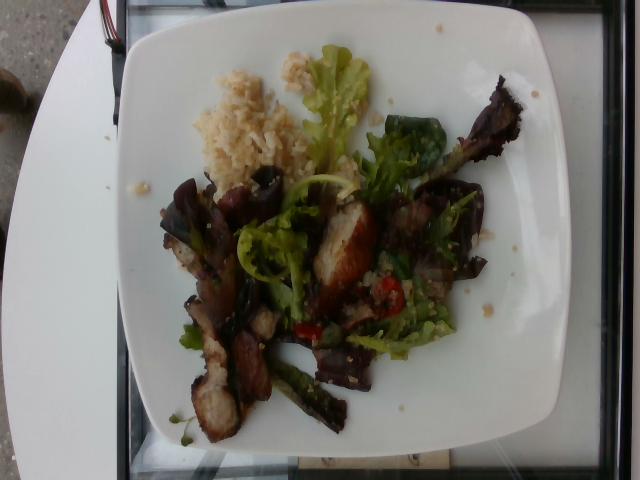

## dish_1561662054 [calories_per_gram: 1.44]

apple; bok choy; garlic; green beans; lemon juice; millet; mixed greens; olive oil; onions; parsley; pepper; pork; salt; soy sauce; sugar; vinegar; white rice


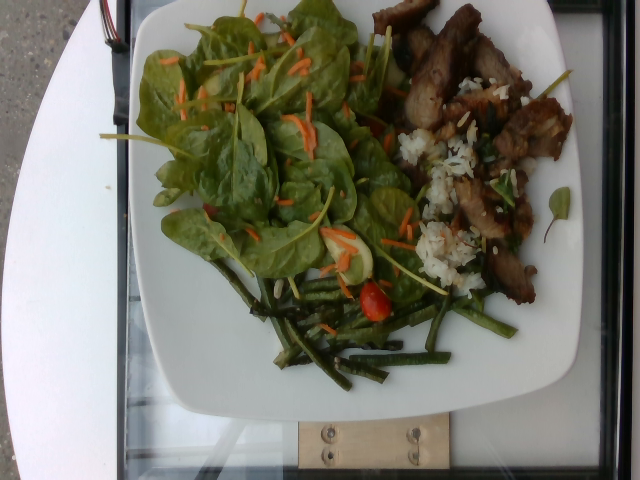

## dish_1562008979 [calories_per_gram: 1.32]

cabbage; caesar salad; carrot; garlic; jalapenos; lemon juice; mayonnaise; olive oil; parsley; pepper; pork; salt; wheat berry


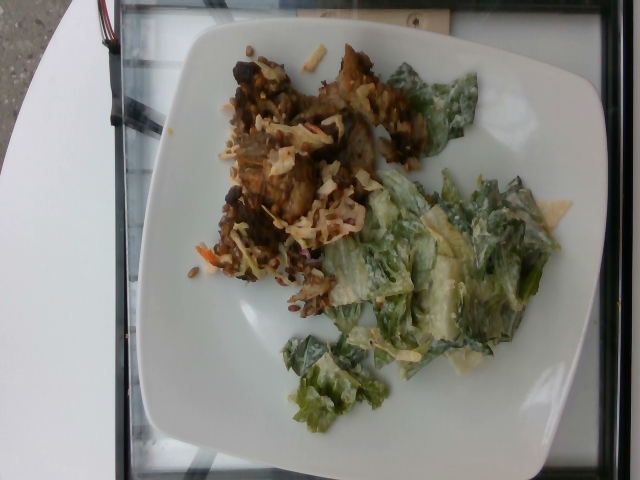

## dish_1560455030 [calories_per_gram: 0.20]

baby carrots; cherry tomatoes; cucumbers


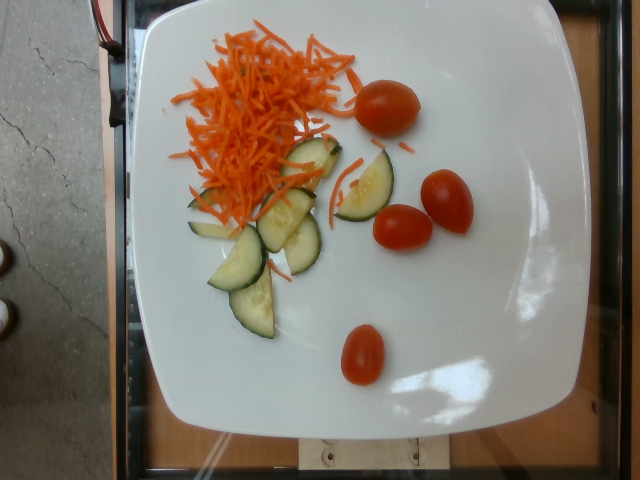

## dish_1558372433 [calories_per_gram: 0.52]

deprecated


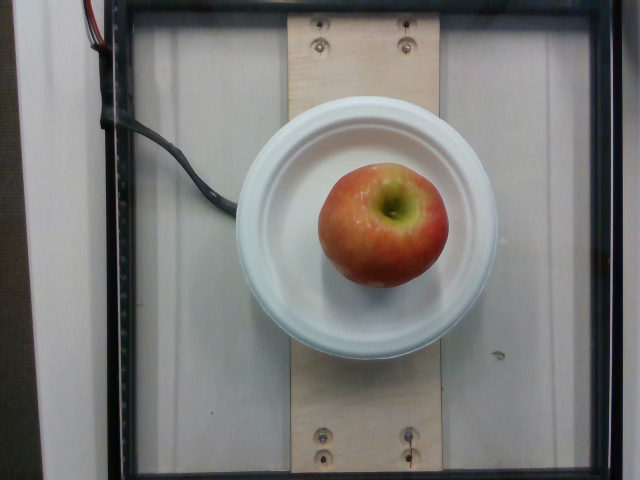

In [19]:
def show_some_dishes(dishes):
    for _, row in dishes.iterrows():
        dish_id = row.dish_id
        ingredient_names = row.ingredient_names
        calories_per_gram = row.calories_per_gram
        image = Image.open(f"data/images/{dish_id}/rgb.png").convert("RGB")
        display(Markdown(f"## {dish_id} [calories_per_gram: {calories_per_gram:.2f}]"))
        print(ingredient_names)
        display(image)

show_some_dishes(dish.head())

Наименование яблока оказалось сломанным (`deprecated`). Посмотрим сколько ещё таких ингредиентов и что это за ингредиенты

In [20]:
ingredients[ingredients["ingr"] == "deprecated"]

,id,ingr,ingr_id
230,231,deprecated,ingr_0000000231
452,453,deprecated,ingr_0000000453
457,458,deprecated,ingr_0000000458
469,470,deprecated,ingr_0000000470


В словаре ингредиентов 4 значения со сломанными наименованиями. Визуализируем их

In [21]:
deprecated_ingr = "ingr_0000000231"
display(Markdown(f'# {deprecated_ingr}'))
show_some_dishes(dish[dish["ingredients"].str.contains(deprecated_ingr)].head())

# ingr_0000000231

# ingr_0000000453

## dish_1558372433 [calories_per_gram: 0.52]

deprecated


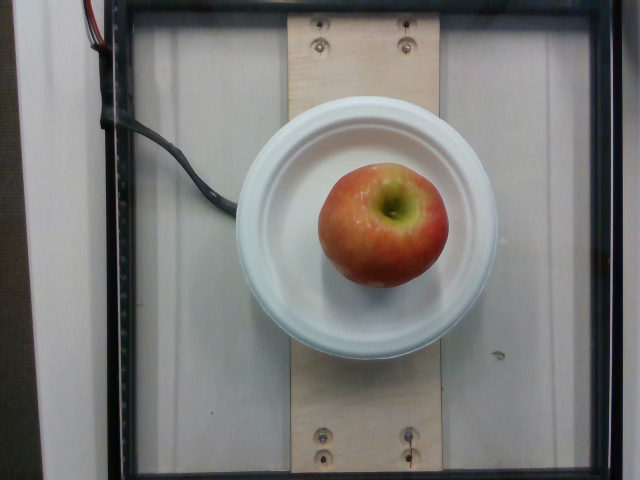

## dish_1558114086 [calories_per_gram: 0.52]

deprecated


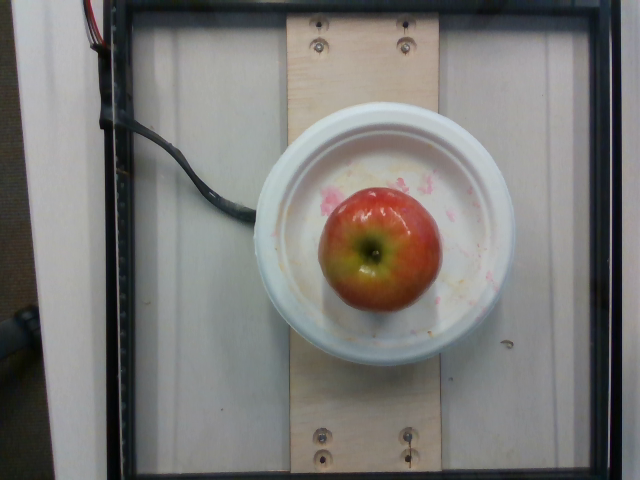

## dish_1558373159 [calories_per_gram: 3.03]

almonds; deprecated; sausage


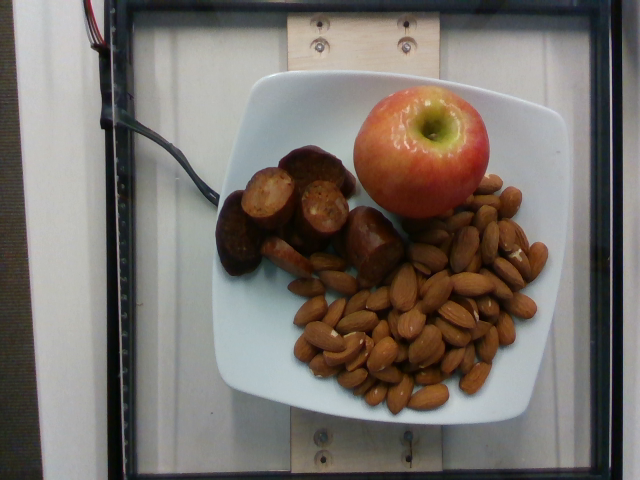

## dish_1558115364 [calories_per_gram: 1.55]

almonds; bacon; deprecated; potatoes


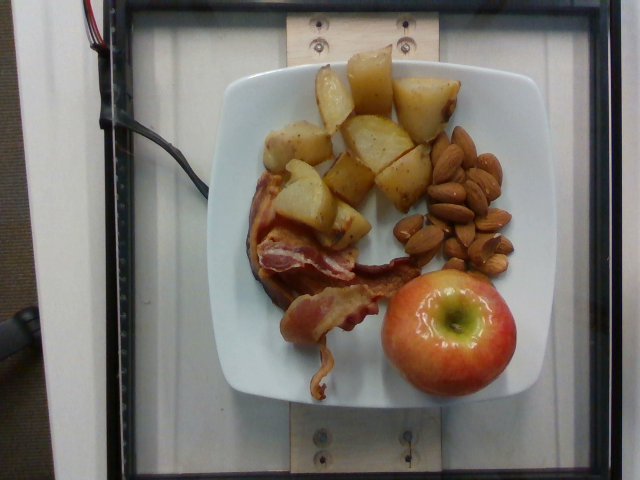

## dish_1558114875 [calories_per_gram: 0.52]

deprecated


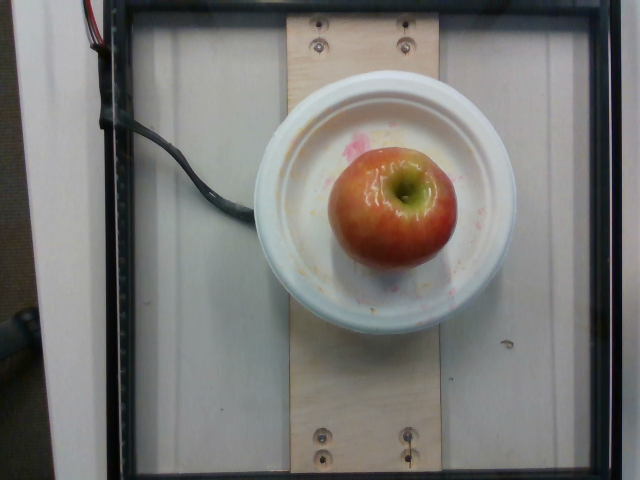

In [22]:
deprecated_ingr = "ingr_0000000453"
display(Markdown(f'# {deprecated_ingr}'))
show_some_dishes(dish[dish["ingredients"].str.contains(deprecated_ingr)].head())

# ingr_0000000458

## dish_1558027001 [calories_per_gram: 0.30]

deprecated


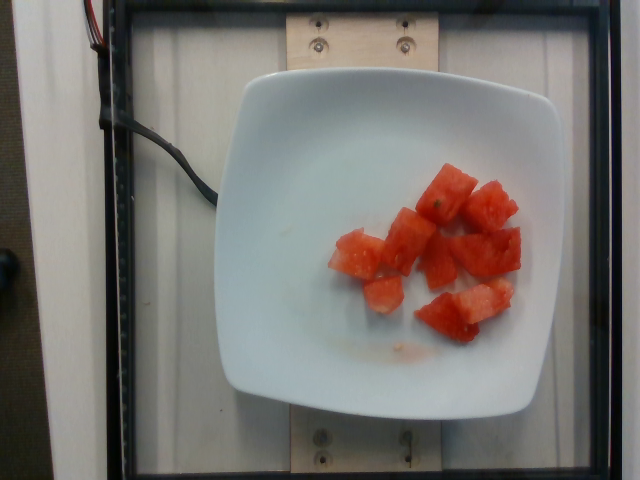

## dish_1558028142 [calories_per_gram: 0.30]

deprecated


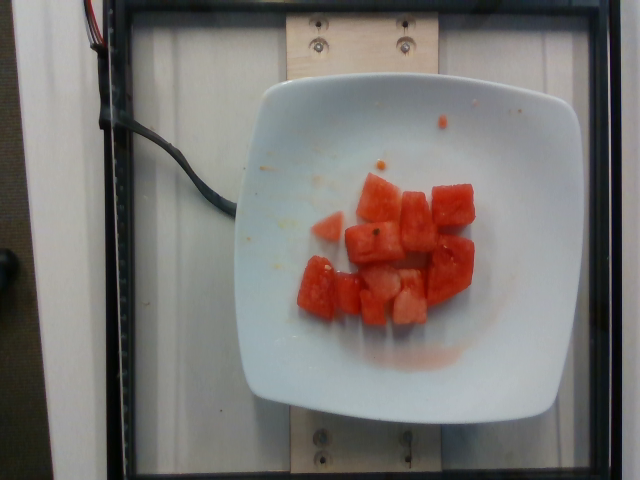

## dish_1558031019 [calories_per_gram: 1.05]

bacon; deprecated; honeydew melons; yam


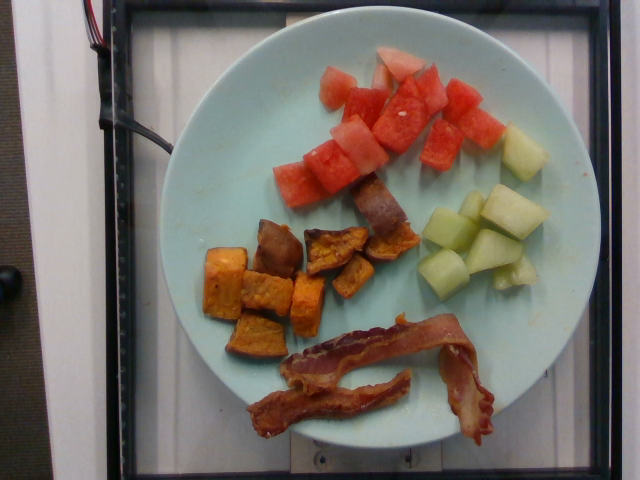

## dish_1558030724 [calories_per_gram: 0.30]

deprecated


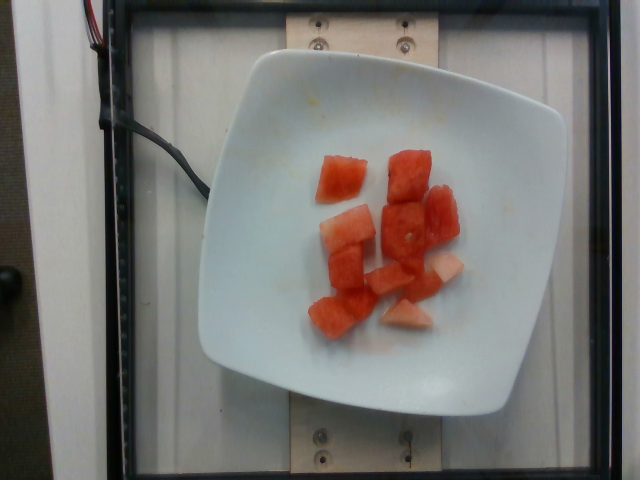

## dish_1558027243 [calories_per_gram: 1.62]

bacon; deprecated; yam


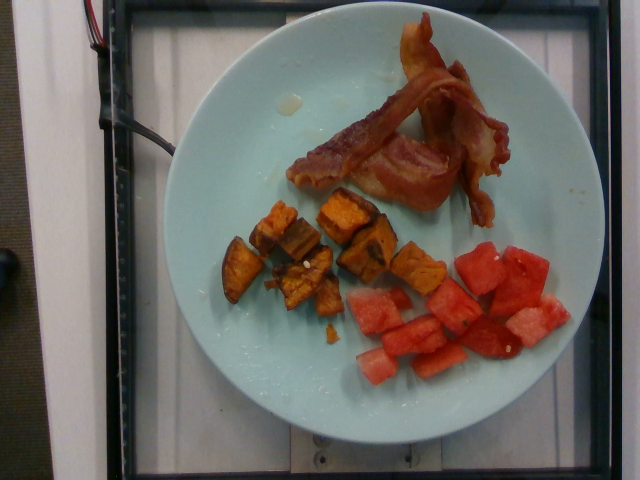

In [23]:
deprecated_ingr = "ingr_0000000458"
display(Markdown(f'# {deprecated_ingr}'))
show_some_dishes(dish[dish["ingredients"].str.contains(deprecated_ingr)].head())

In [24]:
deprecated_ingr = "ingr_0000000470"
display(Markdown(f'# {deprecated_ingr}'))
show_some_dishes(dish[dish["ingredients"].str.contains(deprecated_ingr)].head())

# ingr_0000000470

---
Два из четырех сломанных ингредиентов можно починить: яблоко и арбуз

In [25]:
ingredient_dict["ingr_0000000453"] = "apple"
ingredient_dict["ingr_0000000458"] = "watermelon"
dish["ingredient_names"] = dish["ingredients"].apply(name_ingredients)

---
Изучение блюд со сломанными наименованиями выявило дубли блюд: с одинаковым составом и калорийностью. Дубли в обучении могут привести к худшему качеству. Модель может сместиться в вердиктах из-за смещенного распределения классов в train

Избавимся от дубликатов, при этом сохраним все изображения дублей и при обучении будем показывать рандомную картинку.

Получим таблицу с новыми сущностями `mega_dish` (дедуплицированными блюдами), на всякий случай заведем для этих сущностей новый id `mega_dish_id`

In [26]:
def aggregate_dishes(df):
    new_df = df.groupby(["ingredient_names", "calories_per_gram"]).agg({
        "dish_id": lambda x: ','.join(x),
        "total_mass": "max",
    }).reset_index()
    new_df = new_df.rename(columns={
        "dish_id": "dishes",
    })
    new_df["total_calories"] = new_df["total_mass"] * new_df["calories_per_gram"]
    new_df["mega_dish_id"] = new_df["dishes"].apply(lambda x: sha256(x.encode()).hexdigest())
    return new_df

train_df = aggregate_dishes(dish[dish["split"] == "train"])
train_df.head()

,ingredient_names,calories_per_gram,dishes,total_mass,total_calories,mega_dish_id
0,almonds,5.781000,"dish_1558637393,dish_1558721757,dish_155811586...",133.0,768.873000,5c40a1036dad73f1e53e876f7914fcce9e60a8aa61163a...
1,almonds; apple; bacon; potatoes,1.550351,dish_1558115364,313.0,485.259863,75332feb78600b8b4fc87e041881a2948dde4e12f26b0c...
2,almonds; apple; brussels sprouts; carrot,1.364887,dish_1558724959,426.0,581.441862,92c8166715ca126fbc273281c4380888e59fd391345db3...
3,almonds; apple; cantaloupe; cauliflower,2.066487,dish_1558721827,429.0,886.522923,e8a891c20a00256695bafd91a74bca059ab7df79fa6712...
4,almonds; apple; cantaloupe; cauliflower; cherr...,0.828372,dish_1558722103,368.0,304.840896,fe28d29aea4aeb4e6a288500daee0f1df2eab922f7b2ed...


---
Для валидации и приемки такой операции не требуется, будем оценивать качества на всех изображениях всех блюд в test сплите.

Для общности повторим структуру train-датафрейма

In [27]:
def get_test_dishes(df):
    df["dishes"] = df["dish_id"]
    df["mega_dish_id"] = df["dish_id"]
    return df

test_df = get_test_dishes(dish[dish["split"] == "test"])
test_df.head()

,dish_id,total_calories,total_mass,ingredients,split,ingredient_names,calories_per_gram,dishes,mega_dish_id
0,dish_1561662216,300.794281,193.0,ingr_0000000508;ingr_0000000122;ingr_000000002...,test,apple; bok choy; brown rice; garlic; lemon jui...,1.558520,dish_1561662216,dish_1561662216
2,dish_1562008979,382.936646,290.0,ingr_0000000448;ingr_0000000520;ingr_000000046...,test,cabbage; caesar salad; carrot; garlic; jalapen...,1.320471,dish_1562008979,dish_1562008979
16,dish_1561739238,274.190002,257.0,ingr_0000000128;ingr_0000000015;ingr_000000001...,test,berries; egg whites; hash browns; sweet potato,1.066887,dish_1561739238,dish_1561739238
23,dish_1562691032,419.681702,415.0,ingr_0000000013;ingr_0000000161;ingr_000000003...,test,berries; broccoli; olive oil; pineapple; roast...,1.011281,dish_1562691032,dish_1562691032
26,dish_1558549773,2.300000,10.0,ingr_0000000036,test,spinach (raw),0.230000,dish_1558549773,dish_1558549773


# Этап 2. Реализуйте пайплайн обучения
Используя `.py`-файлы для сохранения кода, реализуйте:
- Загрузчики данных и датасеты.
- Опциональный код предобработки/аугментации данных.
- Код обучения и валидации для импортирования в виде одной функции (`train`).
- Конфиг-файл для запуска модели и сохранения результатов обучения.
- Код для получения воспроизводимых результатов (`seed`) с выводом метрик.

Рекомендуемая структура: первый файл для работы с данными назовите `dataset.py`, второй — по запуску обучения — `utils.py`.

**Результат**: Python-файл или файлы с воспроизводимым кодом обучения. Все результаты должны воспроизводиться путём вызова `train` с передачей конфигурационного файла.

---
Кажется разумным реализовать создание загрузчика данных в виде метода датасета (см. файл `dataset.py`).

Так, мы один раз инициализируем tokenizer в виде атрибута датасета, чтобы вызывать его во всех местах где требуется токенизация его данных.

По той же причине объявление аугментаций происходит внутри датасета. Именно там парсится конфиг базовой CV-модели, именно там требуется вызов аугментаций (в методе получения элемента датасета). 

In [56]:
train_dataset = MultimodalDataset(config, train_df, type="train")
val_dataset = MultimodalDataset(config, test_df, type="test")

train_loader = train_dataset.get_dataloader(batch_size=config.BATCH_SIZE, shuffle=True)
val_loader = val_dataset.get_dataloader(batch_size=config.BATCH_SIZE, shuffle=False)

Модель объявляется в файле `model.py`.

Архитектура модели:
- предобученная текстовая модель для генерации эмбедингов ингредиентов (с возможностью разморозки весов для дообучения)
- предобученная CV-модель для генерации эмбедингов изображений блюд (также можно разморозить веса для дообучения)
- полученные эмбединги моделей конкатенируются
- полученный тензор эмбедингов подается в fully connected нейросеть из двух слоев регулируемого размера с leakyReLU активацией и нормализацией и dropout-регуляризацией 

---
Функция `train` объявлена в модуле `utils.py`.

Резюме:
- обучение происходит на CUDA-девайсе (если CUDA не доступен, обучается на CPU)
- в качестве оптимизатора выбран алгоритм AdamW
- для каждой части модели (экстрактор фичей текста, картинок и итоговая сеть-регрессор) используется свой learning rate
- целевая метрика обучения совпадается с приемочной метрикой: MAE
- если полученная в эпохе модель оказывается лучшей (на валидации) - она сохраняется на диск, а её метаданные записываются в файл `metadata.json`. Туда же сериализуется конфиг и метрики модели

Ниже приводится код, которым вызывается обучение.

In [32]:
# model = MultimodalModel(config)
# train(model, train_loader, val_loader, config, verbose=True)

# Этап 3. Обучение модели
Выполните обучение модели на предоставленной ВМ с использованием кода с этапа 2. 

Запуск обучения проводите в Jupyter Notebook с логированием результатов в stdout ячейки. Чтобы ускорить обучение, используйте GPU, предоставленную в ВМ. 

По достижении заданного качества сохраните артефакт обученной модели. Модель должна сохраняться/импортироваться согласно пути, указанному в конфигурационном файле. 

**Результат**: артефакт обученной модели. 

---
Обучение проходило на сервере с GPU

Для загрузки сохраненных моделей с сервера используется функция `copy_new_files_sftp` объявленная в `utils.py`. Ниже приведен пример вызова функции.

In [ ]:
copy_new_files_sftp(
    "111.88.148.169",
    "ubuntu",
    private_key_path=os.path.expanduser("~/.ssh/user_key"),
    remote_dir='project/models',
    local_dir=os.path.expanduser("~/Documents/Практикум/Deep learning Engineer/dle_practicum/Sprint 4/project/models"),
    force_copy=["metadata.json"]
)

  0%|          | 0/10 [00:00<?, ?it/s]

Скопирован: metadata.json (размер: 5.96 KB)


 20%|██        | 2/10 [00:46<03:04, 23.09s/it]

Скопирован: 904db89f75f3fc714d7c36c1dda58b6e14a882fd24cb07f738236924bda52ebd.pth (размер: 449.45 MB)
Пропущен симлинк: best_model.pth


 60%|██████    | 6/10 [01:27<00:54, 13.60s/it]

Скопирован: 11cd1c983a9fc3058676941f143f5cba6db73fc65397350b207d4ec24f3dce24.pth (размер: 449.45 MB)


 80%|████████  | 8/10 [02:11<00:32, 16.47s/it]

Скопирован: 8476369349f3128e76d4ea58d538391c1c66f83c00da27acdd2b54791fa677fc.pth (размер: 449.45 MB)


100%|██████████| 10/10 [02:53<00:00, 17.39s/it]

Скопирован: 161e9b95e157243e9a23a89b769b429e3095b04dd26777ca9fcd93794f8ddb38.pth (размер: 449.45 MB)

Всего скопировано файлов: 5


---
С помощью файла `metadata.json` найдем лучшую из сохраненных моделей

In [32]:
with open("models/metadata.json", "r") as file:
    metadata = json.load(file)

best_model_id = ""
best_val_mae = 10e5
for k, v in metadata.items():
    if v["val_mae"] < best_val_mae:
        best_val_mae = v["val_mae"]
        best_model_id = k
print(f"ID лучшей модели: {best_model_id}")
print(f"MAE лучшей модели на валидации: {best_val_mae}")

ID лучшей модели: ef5fc7d26242bbbcc71a69cf1f12c9db1b4263dcd55dcce94b30b58cdf3fb17d
MAE лучшей модели на валидации: 40.93619060704459


---
А так выглядит конфиг, с которым удалось обучить эту модель

In [105]:
print(f"Epoch: {metadata[best_model_id]["epoch"]}")
print("Config:")
print(metadata[best_model_id]["config"])

Epoch: 25
Config:
{
    "SEED": 42,
    "TEXT_MODEL_NAME": "bert-base-uncased",
    "IMAGE_MODEL_NAME": "tf_efficientnet_b0",
    "TEXT_MODEL_UNFREEZE": "encoder.layer.11|pooler",
    "IMAGE_MODEL_UNFREEZE": "blocks.6|conv_head|bn2",
    "BATCH_SIZE": 2,
    "TEXT_LR": 3e-05,
    "IMAGE_LR": 0.0001,
    "REGRESSOR_LR": 0.001,
    "EPOCHS": 30,
    "DROPOUT": 0.5,
    "HIDDEN_DIM": 1028,
    "IMAGES_PATH": "data/images",
    "TRAIN_DF_PATH": "data/imdb_train.csv",
    "VAL_DF_PATH": "data/imdb_val.csv",
    "MODELS_PATH": "models"
}


## Этап 4. Валидация качества

В Jupyter Notebook допишите код импорта и инференса предобученной модели (либо же импортируйте готовый код из `.py`-файла). Запустите модель на тестовом сплите данных `test` и выведите финальную целевую метрику по модели.

Выведите топ-5 блюд, по которым оценка модели наименее точна. Опишите возможные причины низкого качества на этих примерах.

**Результат**: выполнен инференс обученной на этапе 3 модели, визуализированы топ-5 самых тяжёлых примеров для модели из test набора, описаны возможные причины низкого качества на этих примерах. 

---
Загрузим модель и убедимся в том, что MAE на валидации ниже целевого значения `50`

In [35]:
best_model = MultimodalModel(config)
best_model.load_state_dict(torch.load(f"{config.MODELS_PATH}/{best_model_id}.pth", map_location=torch.device('cpu')))
best_model_validate_mae = validate(best_model, val_loader, "cpu")

print(f"MAE лучшей модели на валидации: {best_model_validate_mae}")

Loading weights: 100%|██████████| 199/199 [00:00<00:00, 9936.15it/s]
BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


MAE лучшей модели на валидации: 40.93618268797383


---
Действительно MAE на валидации `40.94 < 50`.

Теперь посмотрим самые "сложные" примеры, где модель допустила самые грубые ошибки.

Для удобства сделаем DataFrame куда сложим все предсказания модели и вычислим ошибку модели

In [76]:
test_df_with_preds = apply_model(best_model, val_loader, "cpu")
test_df_with_preds.head()

100%|██████████| 64/64 [01:47<00:00,  1.68s/it]


,mega_dish_id,total_mass,total_calories,calories_per_gram,image,input_ids,attention_mask,predict
0,dish_1561662216,193.0,300.794281,1.558520,"[[[-0.25130581855773926, -0.25130581855773926,...","[101, 6207, 1025, 8945, 2243, 16480, 2100, 102...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",355.308929
1,dish_1562008979,290.0,382.936646,1.320471,"[[[1.581042766571045, 1.563918113708496, 1.563...","[101, 28540, 1025, 11604, 16521, 1025, 25659, ...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",479.462982
2,dish_1561739238,257.0,274.190002,1.066887,"[[[0.2795615494251251, 0.2795615494251251, 0.2...","[101, 22681, 1025, 8288, 12461, 1025, 23325, 1...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, ...",181.815887
3,dish_1562691032,415.0,419.681702,1.011281,"[[[1.3926705121994019, 1.3926705121994019, 1.3...","[101, 22681, 1025, 22953, 21408, 3669, 1025, 9...","[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, ...",401.798401
4,dish_1558549773,10.0,2.300000,0.230000,"[[[0.9645516872406006, 0.36518532037734985, -1...","[101, 6714, 6776, 1006, 6315, 1007, 102, 0, 0,...","[1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, ...",4.750503


In [81]:
def get_abs_error(row):
    return abs(row["total_calories"] - row["predict"])

test_df_with_preds = pd.merge(test_df, test_df_with_preds[["mega_dish_id", "predict"]], on="mega_dish_id", how="inner")
test_df_with_preds["error"] = test_df_with_preds.apply(get_abs_error, axis=1)
test_df_with_preds.head()

,dish_id,total_calories,total_mass,ingredients,split,ingredient_names,calories_per_gram,dishes,mega_dish_id,predict,error
0,dish_1561662216,300.794281,193.0,ingr_0000000508;ingr_0000000122;ingr_000000002...,test,apple; bok choy; brown rice; garlic; lemon jui...,1.558520,dish_1561662216,dish_1561662216,355.308929,54.514648
1,dish_1562008979,382.936646,290.0,ingr_0000000448;ingr_0000000520;ingr_000000046...,test,cabbage; caesar salad; carrot; garlic; jalapen...,1.320471,dish_1562008979,dish_1562008979,479.462982,96.526336
2,dish_1561739238,274.190002,257.0,ingr_0000000128;ingr_0000000015;ingr_000000001...,test,berries; egg whites; hash browns; sweet potato,1.066887,dish_1561739238,dish_1561739238,181.815887,92.374115
3,dish_1562691032,419.681702,415.0,ingr_0000000013;ingr_0000000161;ingr_000000003...,test,berries; broccoli; olive oil; pineapple; roast...,1.011281,dish_1562691032,dish_1562691032,401.798401,17.883301
4,dish_1558549773,2.300000,10.0,ingr_0000000036,test,spinach (raw),0.230000,dish_1558549773,dish_1558549773,4.750503,2.450503


# Топ 5 блюд, где модель допустила наибольшую ошибку

### dish_1565811139 [total calories: 902.20] [predicted: 469.87] [error: 432.33 (47.9%)]

broccoli; carrot; chicken; goat cheese; olive oil; spinach (raw)


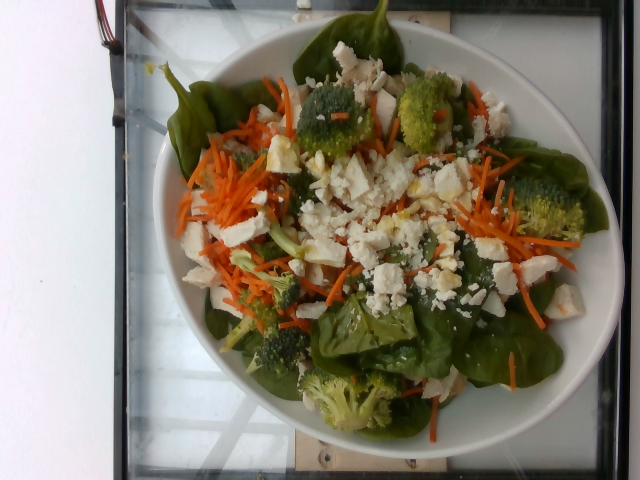

### dish_1558549806 [total calories: 781.96] [predicted: 352.28] [error: 429.68 (54.9%)]

almonds; spinach (raw); white rice


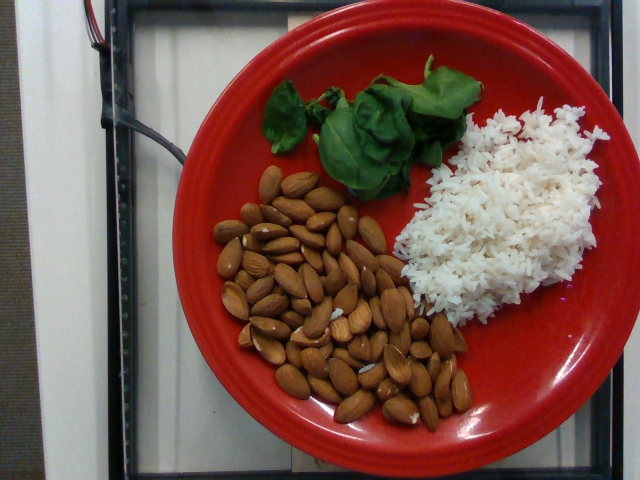

### dish_1558630325 [total calories: 751.54] [predicted: 382.82] [error: 368.72 (49.1%)]

almonds; apple; garden salad


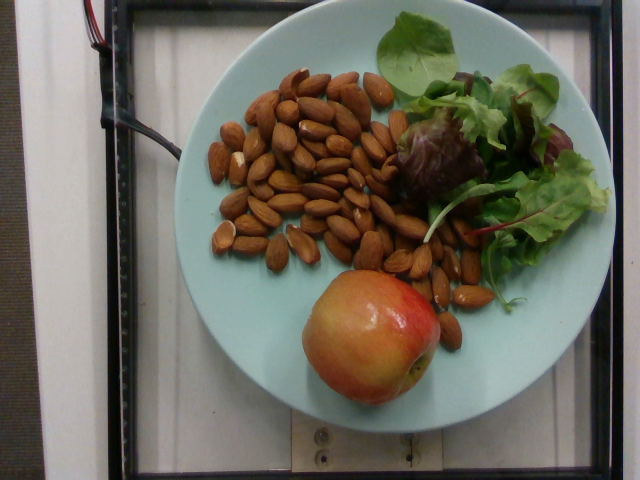

### dish_1558720236 [total calories: 887.82] [predicted: 523.36] [error: 364.46 (41.1%)]

almonds; apple; carrot; cauliflower


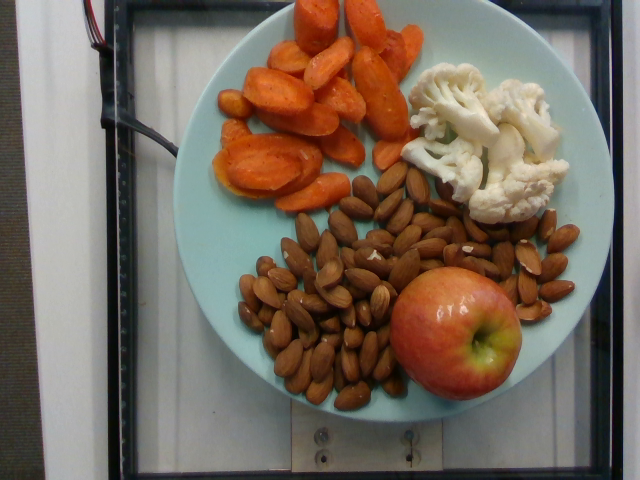

### dish_1565123881 [total calories: 406.82] [predicted: 760.80] [error: 353.98 (87.0%)]

beef; bok choy; caesar salad; chayote squash; cheese pizza; millet; olive oil; onions; salt; shallots; spinach (cooked); vinegar; zucchini


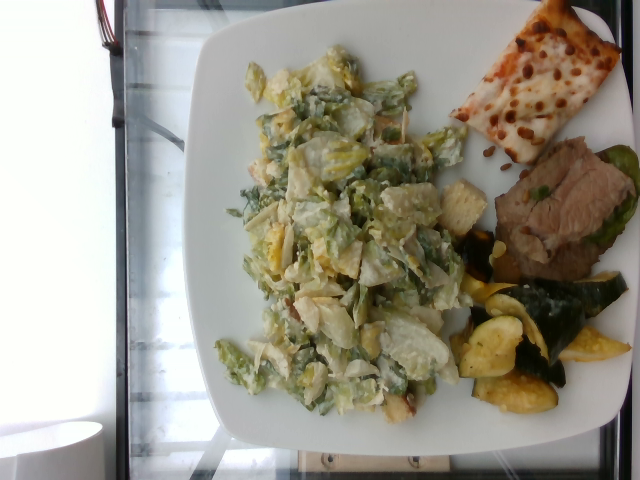

In [95]:
def show_some_dishes(dishes):
    for _, row in dishes.iterrows():
        dish_id = row.dish_id
        ingredient_names = row.ingredient_names
        image = Image.open(f"data/images/{dish_id}/rgb.png").convert("RGB")
        display(Markdown(f"### {dish_id} "
                         f"[total calories: {row.total_calories:.2f}]"
                         f" [predicted: {row.predict:.2f}]"
                         f" [error: {get_abs_error(row):.2f} ({get_abs_error(row)/row.total_calories*100:.1f}%)]"
                          ))
        print(ingredient_names)
        display(image)

display(Markdown(f"# Топ 5 блюд, где модель допустила наибольшую ошибку"))
show_some_dishes(test_df_with_preds.nlargest(5, "error"))

# Топ 5 блюд, где модель допустила наименьшую ошибку

### dish_1563898084 [total calories: 419.49] [predicted: 419.48] [error: 0.01 (0.0%)]

bacon; blueberries; chia seeds; greek yogurt; milk; pineapple; scrambled eggs


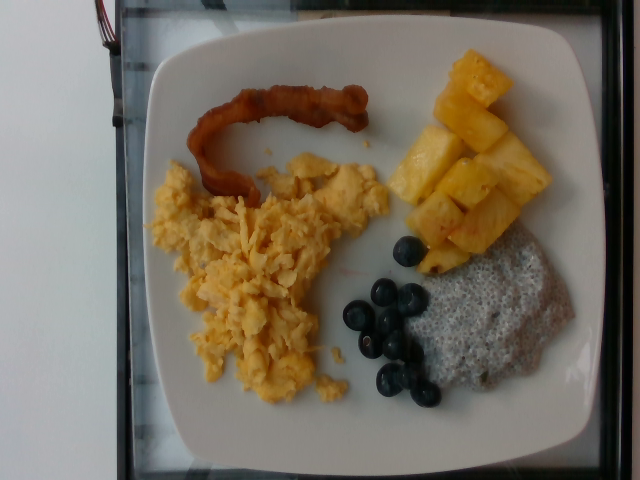

### dish_1563478751 [total calories: 950.40] [predicted: 950.41] [error: 0.02 (0.0%)]

beef; cream; garlic; mushroom; olive oil; onions; pasta; salt; sour cream; spinach (raw); thyme; wine


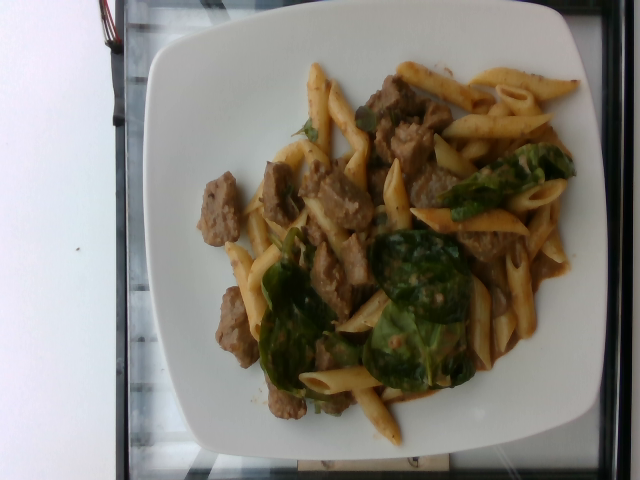

### dish_1557937715 [total calories: 20.67] [predicted: 20.65] [error: 0.02 (0.1%)]

raspberries


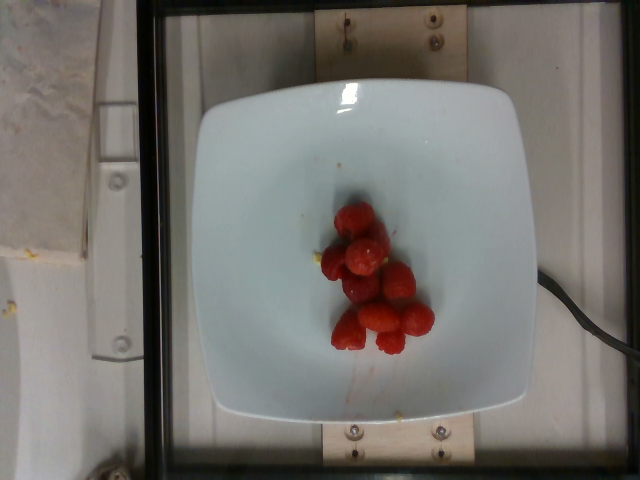

### dish_1558110478 [total calories: 205.44] [predicted: 205.50] [error: 0.06 (0.0%)]

bacon; berries; eggs; yam


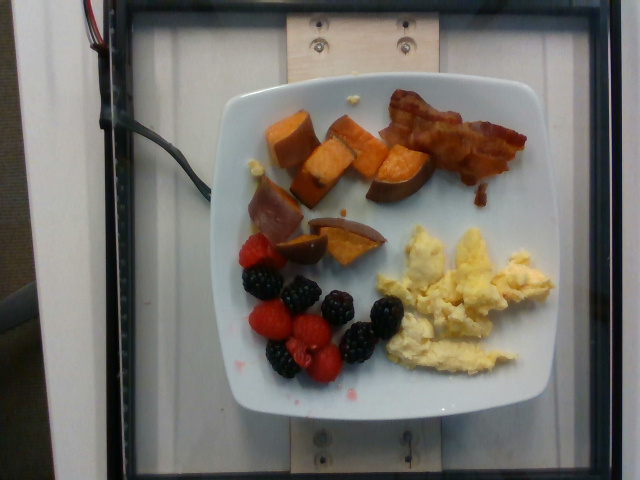

### dish_1561662160 [total calories: 41.84] [predicted: 41.93] [error: 0.09 (0.2%)]

apple; lemon juice; millet; mixed greens; olive oil; onions; parsley; salt; vinegar


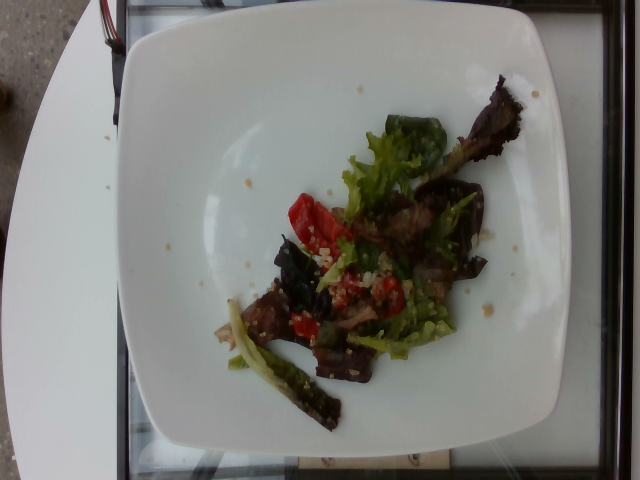

In [98]:
display(Markdown(f"# Топ 5 блюд, где модель допустила наименьшую ошибку"))
show_some_dishes(test_df_with_preds.nsmallest(5, "error"))

---
Визуальный осмотр ошибок дал немного. Разве что я заметил, что все топ 5 блюд с лучшим качеством - это блюда на квадратных тарелках. При этом блюда с худшими предсказаниями, почти все на круглых тарелках, причем одна из них красная, что выглядит довольно редким случаем. 

> Как можно улучшить точность?

Общее:
- больше данных в обучающей выборке, с большим разнообразием - освещением, разными тарелками
- другая архитектура:
   - другие сети для экстракции фичей
   - поэкспериментировать с аугментациями: повороты, цветовые преобразования
   - cross-attention для разных модальностей
   - добавить на вход one-hot-encoded вектор с признаком наличия ингредиента в блюде
   - больше слоев в регрессоре с большим контролем за оверфитом - батч-нормализация, дропаут, нормализация, клиппинг градиентов
- заменить нейросетевой классификатор классическим поверх сверточного блока, например градиентный бустинг или random forest
- провести ablation study модальностей: по очереди исключить модальности и посмотреть на влияние на ошибки, т.о. оценить вклад модельности в ошибку

Частное:
- классифицировать ошибки по ингредиентам. Возможно есть выбросы по каким-то редким ингредиентам

--Тут я рыбу заворачивал-- тут служебный код, чтобы чистить лишние модели

In [ ]:
with open("models/metadata.json", "r") as file:
    metadata = json.load(file)

bad_models = []
for k, v in metadata.items():
    if v["val_mae"] > 70:
       bad_models.append(k)

for model in bad_models:
    metadata.pop(model)
    if os.path.exists(f"models/{model}.pth"):
        os.remove(f"models/{model}.pth")

with open("models/metadata.json", "w") as file:
    json.dump(metadata, file)